# Milestone 3: Shear Wave Decay

In [1]:
import numpy as np
from scipy.signal import argrelextrema
from scipy.optimize import curve_fit
from matplotlib import animation, pyplot as plt
from IPython import display
from src.simulation import LatticeBoltzmann

## Experiment 1

- sinusoidal density: $\rho(r,0) = \rho_0 + \varepsilon \text{sin}\left(\frac{2\pi x}{L_x}\right)$
- zero velocity: $u(r,0) = 0$

### Initialize

In [2]:
size_x = 80
size_y = 20
n_steps = 8000
omega = 1.3
epsilon = 0.01
rho0 = 0.5

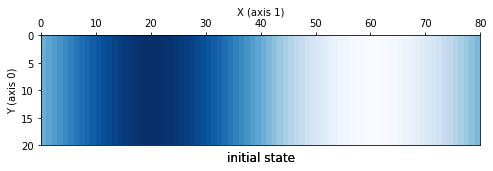

In [3]:
# initialize density
density_x = rho0 + epsilon * np.sin(2*np.pi*np.arange(size_x)/size_x)
density = np.tile(density_x, (size_y, 1))
# create lattice
lattice = LatticeBoltzmann(size_x, size_y, omega=omega, init_density=density)

### Run simulation

In [4]:
sine = np.empty((n_steps+1, lattice.X))
sine[0] = lattice.density[0]
for i in range(n_steps):
    lattice.step()
    # collect the sinusoidal density profile of the first row in each step
    sine[i+1] = lattice.density[0]

In [5]:
# visualize
lattice.plot.display_animation()

### Perform measurements

In [5]:
# use the peak position of the initial sine as measurement point
measurement_point = np.argmax(density_x)
decay = sine[:, measurement_point]

# determine peaks in density decay and plot their sinusoidal shape over time
decay_peaks = np.array([0], dtype=int)
decay_peaks = np.append(decay_peaks, argrelextrema(decay, np.greater)[0])

### Plot the evolution of the density profile over time

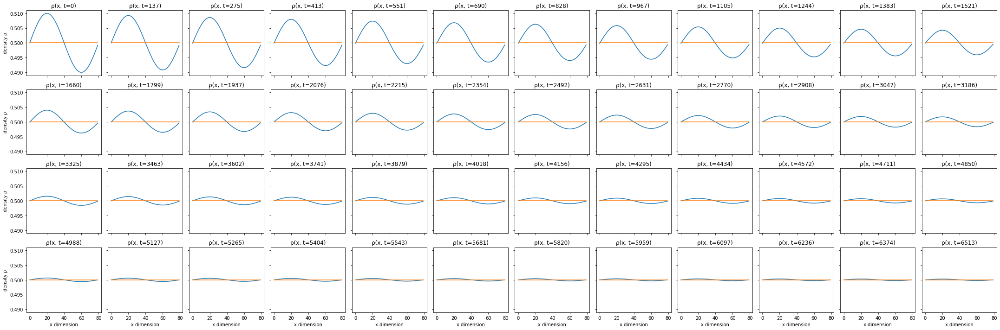

In [6]:
# create subplots
n_cols = 12
n_rows = decay_peaks.shape[0]//n_cols
fig, ax = plt.subplots(n_rows, n_cols, sharex=True, sharey=True, figsize=(30, 30*(n_rows/n_cols)))
axf = ax.flatten()
# fill subplots
for i, p in enumerate(decay_peaks[:n_cols*n_rows]):
    axf[i].plot(sine[p])
    axf[i].plot(np.ones_like(sine[p])*rho0)
    axf[i].set_title(f"ρ(x, t={p})")
    if i >= n_cols*(n_rows-1):
        axf[i].set_xlabel("x dimension")
    if i % n_cols == 0:
        axf[i].set_ylabel("density ρ")
fig.tight_layout()
plt.show()

### Compare density decay with analytical solution

$a(t) = a_0 + \varepsilon \cdot \text{exp}\left(- \nu \left(\frac{2\pi}{L_x}\right)^2 t\right)$ with $\nu = \frac{1}{3}\left(\frac{1}{\omega} - \frac{1}{2}\right)$

In [8]:
def pertubation_formula(a0: float, e: float, v: np.ndarray, l: int, n: int) -> np.ndarray:
    return a0 + e * np.exp(-v * (2*np.pi/l)**2 * np.arange(n))

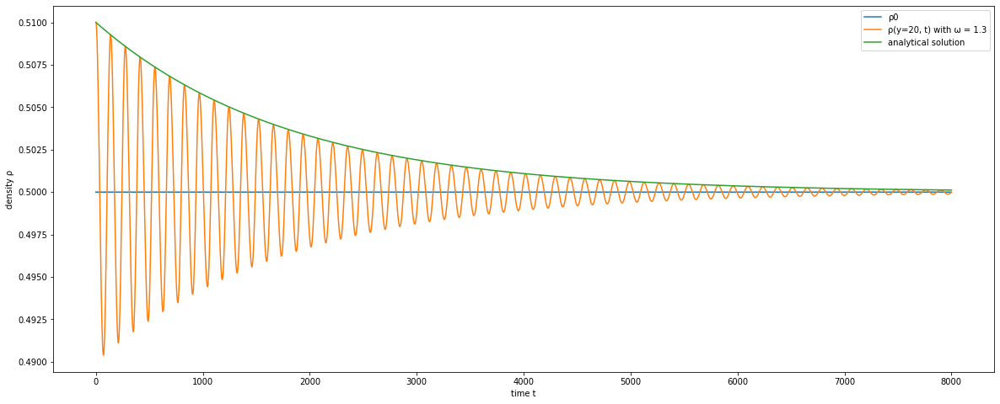

In [9]:
plt.figure(figsize=(20, 8))
plt.xlabel("time t")
plt.ylabel("density ρ")
plt.plot(np.ones_like(decay)*rho0, label="ρ0")
plt.plot(decay, label=f"ρ(y={measurement_point}, t) with ω = {omega}")
plt.plot(pertubation_formula(rho0, epsilon, lattice.viscosity, lattice.X, len(decay)), label="analytical solution")
plt.legend()
plt.show()

### Compare density decay with analytical solution for different $\omega$

Take measurements:

In [10]:
omegas = [0.1, 0.3, 0.5, 0.7, 0.9, 1.1, 1.3, 1.5, 1.7, 1.9]
decay = np.empty((len(omegas), n_steps+1))
viscosity = np.empty((len(omegas)))
for o, omega in enumerate(omegas):
    # create lattice
    lattice = LatticeBoltzmann(size_x, size_y, omega=omega, init_density=density, plot=False, animate=False)
    viscosity[o] = lattice.viscosity
    # run simulation
    decay[o, 0] = lattice.density[0, measurement_point] - rho0
    for i in range(n_steps):
        lattice.step()
        # take measurement
        decay[o, i+1] = lattice.density[0, measurement_point] - rho0

Plot:

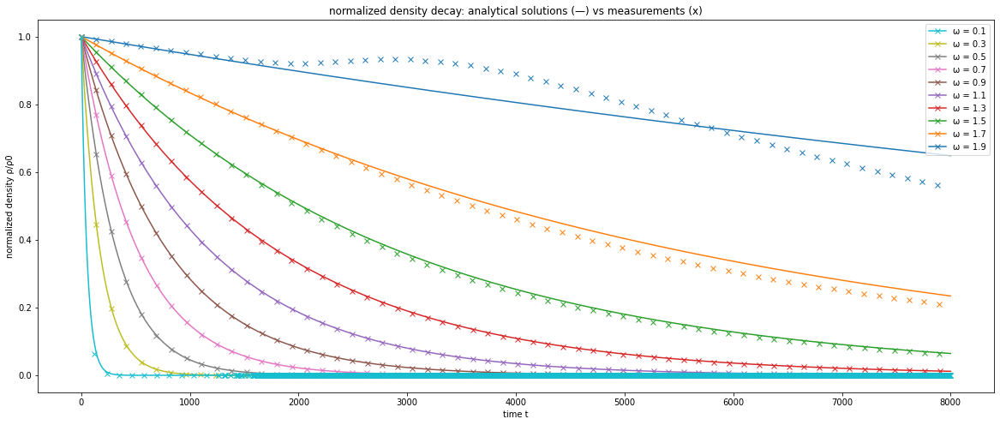

In [11]:
plt.figure(figsize=(20, 8))
plt.title("normalized density decay: analytical solutions (—) vs measurements (x)")
plt.xlabel("time t")
plt.ylabel("normalized density ρ/ρ0")
legend = np.empty((len(omegas), 2), dtype=tuple)
for o, omega in reversed(list(enumerate(omegas))):
    # find measurements peaks, since those need to align with the exponential
    peaks = np.append([0], argrelextrema(decay[o], np.greater)[0])
    norm = decay[o, 0]
    p1, = plt.plot(peaks, decay[o][peaks]/norm, "x")
    # analytical solution
    p2, = plt.plot(pertubation_formula(0, epsilon, viscosity[o], size_x, len(decay[o]))/norm, p1.get_color())
    # legend
    legend[o] = [(p1, p2), f"ω = {omega}"]
plt.legend(legend[:, 0], legend[:, 1])
plt.show()

### Compare the measured viscosity with the analytical prediction

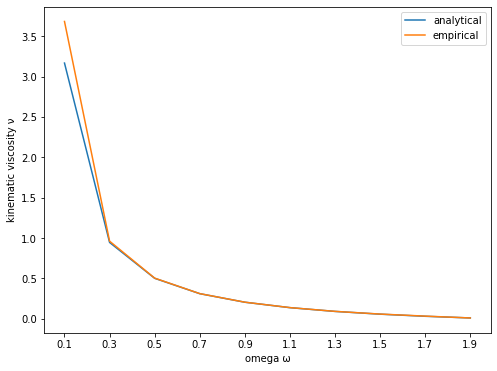

In [12]:
viscosity_measured = np.empty_like(viscosity)
for o, omega in enumerate(omegas):
    peaks = np.append([0], argrelextrema(decay[o], np.greater)[0])
    viscosity_measured[o] = curve_fit(lambda t, v: epsilon * np.exp(-v * (2*np.pi/size_x)**2 * t),
                                      xdata=peaks,
                                      ydata=decay[o][peaks])[0][0]

plt.figure(figsize=(8, 6))
plt.xlabel("omega ω")
plt.ylabel("kinematic viscosity ν")
plt.xticks(omegas)
plt.plot(omegas, viscosity, label="analytical")
plt.plot(omegas, viscosity_measured, label="empirical")
plt.legend()
plt.show()

## Experiment 2

- constant density: $\rho(r,0) = 1$
- sinusoidal velocity in x direction: $u_x(r,0) = \varepsilon \text{sin}\left(\frac{2\pi y}{L_y}\right)$

### Initialize

In [7]:
size_x = 20
size_y = 80
n_steps = 8000
omega = 1.3
epsilon = 0.1

In [9]:
# initialize velocity
velocity_y = epsilon * np.sin(2*np.pi*np.arange(size_y)/size_y)
velocity = np.array([np.zeros((size_y, size_x)),
                     np.tile(velocity_y[:, np.newaxis], (1, size_x))])
# initialize density
density = np.ones((size_y, size_x))
# create lattice
lattice = LatticeBoltzmann(size_x, size_y, omega=omega, init_density=density, init_velocity=velocity, plot=False, animate=False)

### Run simulation

In [10]:
sine = np.empty((n_steps+1, lattice.Y))
sine[0] = lattice.velocity[1, :, 0]
for i in range(n_steps):
    lattice.step()
    # collect the sinusoidal density profile of the first row in each step
    sine[i+1] = lattice.velocity[1, :, 0]

### Plot the evolution of the velocity profile over time

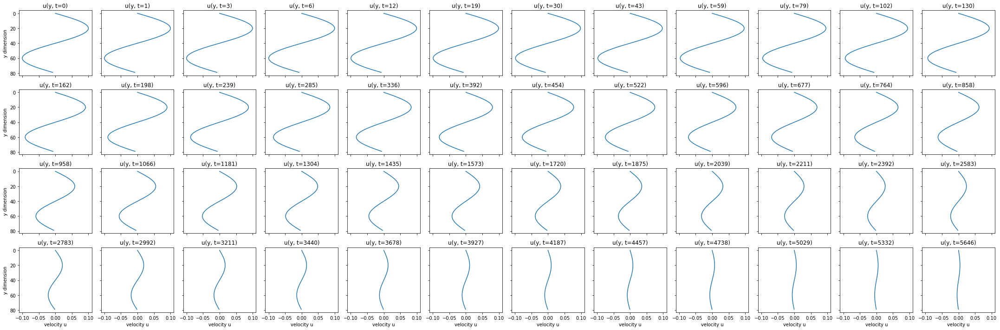

In [11]:
n_cols = 12
frames = np.unique((np.arange(n_steps**(1/np.e), step=0.5)**np.e).astype(int))  # exponential steps
n_rows = len(frames)//n_cols
fig, ax = plt.subplots(n_rows, n_cols, sharex=True, sharey=True, figsize=(30, 30*(n_rows/n_cols)))
axf = ax.flatten()
axf[0].invert_yaxis()
# fill subplots
y_axis = np.arange(lattice.Y)
for i, t in enumerate(frames[:n_cols*n_rows]):
    axf[i].plot(sine[t], y_axis)
    axf[i].set_title(f"u(y, t={t})")
    if i >= n_cols*(n_rows-1):
        axf[i].set_xlabel("velocity u")
    if i % n_cols == 0:
        axf[i].set_ylabel("y dimension")
fig.tight_layout()
plt.show()

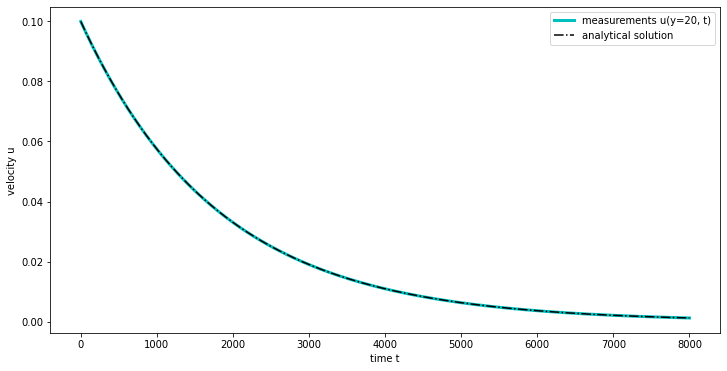

In [72]:
plt.figure(figsize=(12, 6))
plt.xlabel("time t")
plt.ylabel("velocity u")
measurement_point = np.argmax(velocity_y)
decay = sine[:, measurement_point]
plt.plot(decay, "c", linewidth=3, label=f"measurements u(y={measurement_point}, t)")
plt.plot(pertubation_formula(0, epsilon, lattice.viscosity, lattice.Y, n_steps), "k-.", label="analytical solution")
plt.legend()
plt.show()

### Compare velocity decay with analytical solution for different $\omega$

Take measurements:

In [18]:
omegas = [0.1, 0.3, 0.5, 0.7, 0.9, 1.1, 1.3, 1.5, 1.7, 1.9]
decay = np.empty((len(omegas), n_steps+1))
viscosity = np.empty((len(omegas)))
for o, omega in enumerate(omegas):
    lattice = LatticeBoltzmann(size_x, size_y, omega=omega, init_density=density, init_velocity=velocity, plot=False, animate=False)
    viscosity[o] = lattice.viscosity
    # run simulation
    decay[o, 0] = lattice.velocity[1, measurement_point, 0]
    for i in range(n_steps):
        lattice.step()
        # take measurement
        decay[o, i+1] = lattice.velocity[1, measurement_point, 0]

Plot:

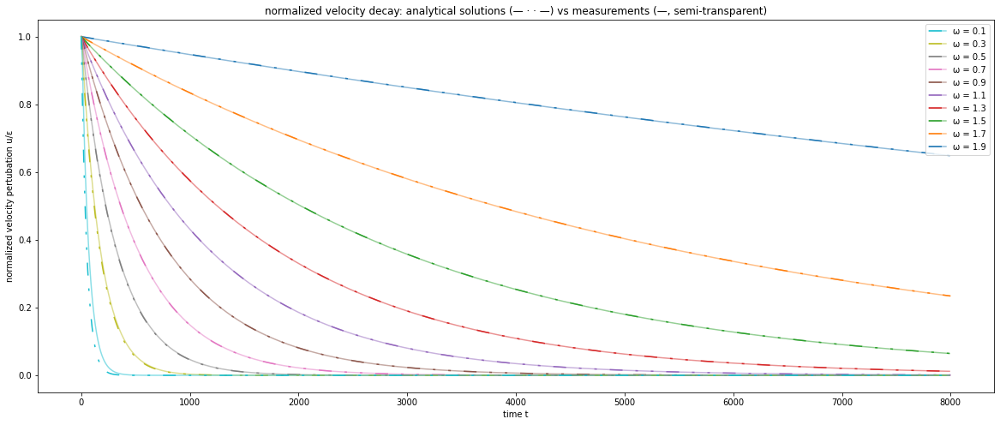

In [19]:
plt.figure(figsize=(20, 8))
plt.title("normalized velocity decay: analytical solutions (— · · —) vs measurements (—, semi-transparent)")
plt.xlabel("time t")
plt.ylabel("normalized velocity pertubation u/ε")
legend = np.empty((len(omegas), 2), dtype=tuple)
for o, omega in reversed(list(enumerate(omegas))):
    # find measurements peaks, since those need to align with the exponential
    measurement_samples = np.arange(decay[o].shape[0])[0:-1:10]
    norm = decay[o, 0]
    p1, = plt.plot(measurement_samples, decay[o][measurement_samples]/norm, alpha=0.5)
    # analytical solution
    sol = pertubation_formula(0, epsilon, viscosity[o], size_y, len(decay[o])) / norm
    p2, = plt.plot(sol, linestyle="-.", dashes=(10, 10, 2, 10, 2, 10), color=p1.get_color())
    # legend
    legend[o] = [(p1, p2), f"ω = {omega}"]
plt.legend(legend[:, 0], legend[:, 1])
plt.show()

### Compare the measured viscosity with the analytical prediction

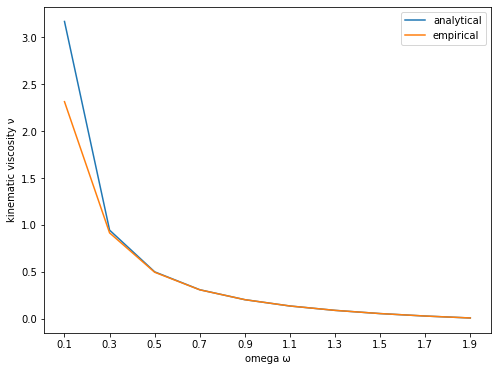

In [20]:
viscosity_measured = np.empty_like(viscosity)
for o, omega in enumerate(omegas):
    viscosity_measured[o] = curve_fit(lambda t, v: epsilon * np.exp(-v * (2*np.pi/size_y)**2 * t),
                                      xdata=np.arange(decay[o].shape[0]),
                                      ydata=decay[o])[0][0]

plt.figure(figsize=(8, 6))
plt.xlabel("omega ω")
plt.ylabel("kinematic viscosity ν")
plt.xticks(omegas)
plt.plot(omegas, viscosity, label="analytical")
plt.plot(omegas, viscosity_measured, label="empirical")
plt.legend()
plt.show()